<a href="https://colab.research.google.com/github/dataforgoodfr/batch7_satellite_ges/blob/master/notebooks/04_04_OCO2_China_Peaks.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
!apt-get install libgeos-3.5.0
!apt-get install libgeos-dev
!pip install https://github.com/matplotlib/basemap/archive/master.zip

# OCO2 - Reproduce F. Chevallier's figures

Project for **Data For Good**, season 7. 

*By Quentin Kamenda*


---

## Introduction

Using Data from [OCO-2 Satellite](en.wikipedia.org/wiki/Orbiting_Carbon_Observatory_2), issued by the NASA.

We here try to reproduce the results from [this paper](https://www.atmos-chem-phys-discuss.net/acp-2020-123/) by F. Chevallier, trying to "[observe] carbon dioxide emissions over China's cities with the Orbiting Carbon Observatory-2".

`//TODO: Explanation`

In [0]:
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
from mpl_toolkits.basemap import Basemap  #Imported directly from the github repository

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


## Show Data on the map

##### **draw_map**: Function to draw the map and the observations (relief style). The column names can be specified in the arguments.

*Parameters*: 

*   (DataFrame) data: the dataset to map.
*   (string) **x** : the name of the longitude column. *default: 'longitide'*
*   (string) **y**: the name of the latitude column. *default: 'latitude'*
*   (string) **c**: the name of the XCO2 column (or other measure wanted to be plotted). *default: 'xco2'*
*   (int) **lon_min** : the minimum longitude. *default: -180*
*   (int) **lon_max**: the maximum longitude. *default: 180*
*   (int) **lat_min**: the minimum latitude. *default: -90*
*   (int) **lat_max**: the maximum latitude. *default: 90*
*   (int) **size_point**: size of the point to plot (useful if we zoom in). *default: 1*
*   (Bool) **frontier**: whether or not to draw the countries borders. *default: False*



In [0]:
def draw_map(data, x="longitude", y="latitude", c="xco2", lon_min=-180, lon_max=180, lat_min=-90, lat_max=90, size_point=1, frontier=False):

    plt.figure(figsize=(15, 10), edgecolor='w')
    m = Basemap(llcrnrlat=lat_min, urcrnrlat=lat_max, llcrnrlon=lon_min, urcrnrlon=lon_max)
    
    m.shadedrelief()
    
    parallels = np.arange(-80.,81,10.)
    m.drawparallels(parallels,labels=[False,True,True,False])

    meridians = np.arange(10.,351.,20.)
    m.drawmeridians(meridians,labels=[True,False,False,True])

    normal = matplotlib.colors.LogNorm(vmin=data[c].min(), vmax=data[c].max())

    m.scatter(data[x], data[y], c=data[c], cmap=plt.cm.jet, s=size_point, norm=normal)

    if (frontier):
      m.drawcountries(linewidth=0.5)
      m.drawcoastlines(linewidth=0.7)

    plt.show()

##### **haversine**: Function to calculate the great circle distance between two points on the earth given longitude and latitude.

*Parameters*: 

*   (int) **lon1** : the longitude of the first point.
*   (int) **lon2**: the latitude of the first point.
*   (int) **lat1**: the longitude of the second point.
*   (int) **lat2**: the latitude of the second point.

*Return:*


*   (int) the distance (in kilometers)

In [0]:
from math import radians, cos, sin, asin, sqrt

def haversine_formula(lon1, lat1, lon2, lat2):
    # convert decimal degrees to radians 
    lon1, lat1, lon2, lat2 = map(radians, [lon1, lat1, lon2, lat2])

    # haversine formula 
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * asin(sqrt(a)) 
    r = 6371 # Radius of earth in kilometers. Use 3956 for miles
    return c * r

def haversine(row, lat, lon):
    return haversine_formula(lon, lat, row['longitude'], row['latitude'])

---

## Retieve Data

Sample data can be accessed freely on the NASA Database, among other open data from several NASA sattelites.

We will be using CSV aggregated by *Benoit Courty* [here](https://http://benemie.fr/OCO2/).

In [0]:
data_1610 = pd.read_csv("http://courty.fr/OCO2/oco2_1610.csv", sep=";")
data_1705 = pd.read_csv("http://courty.fr/OCO2/oco2_1705.csv", sep=";")
data_1803 = pd.read_csv("http://courty.fr/OCO2/oco2_1803.csv", sep=";")
data_1805 = pd.read_csv("http://courty.fr/OCO2/oco2_1805.csv", sep=";")
data_1808 = pd.read_csv("http://courty.fr/OCO2/oco2_1808.csv", sep=";")
data_1809 = pd.read_csv("http://courty.fr/OCO2/oco2_1809.csv", sep=";")

data_1610.head()

,sounding_id,latitude,longitude,xco2,xco2_uncert,orbit,windspeed_u,windspeed_v
0,2016100101110037,-51.334530,-168.044601,401.371155,0.705995,11967,10.771300,5.545009
1,2016100101110038,-51.333263,-168.072342,401.515686,0.710246,11967,10.760405,5.543176
2,2016100101110073,-51.320339,-167.939957,401.222321,0.683168,11967,10.800521,5.544136
3,2016100101110074,-51.319645,-167.967422,401.089478,0.656449,11967,10.790007,5.542420
4,2016100101110078,-51.315422,-168.077682,401.365204,0.592020,11967,10.746749,5.534678


In [0]:
data_1705.describe()

,sounding_id,latitude,longitude,xco2,xco2_uncert,orbit,windspeed_u,windspeed_v
count,2.593966e+06,2.593966e+06,2.593966e+06,2.593966e+06,2.593966e+06,2.593966e+06,2.593966e+06,2.593966e+06
mean,2.017052e+15,9.658301e+00,-4.031502e+00,4.050389e+02,5.067525e-01,1.528165e+04,-1.798047e+00,1.070807e-01
std,8.959621e+08,2.753949e+01,1.108364e+02,2.423594e+00,1.417952e-01,1.304884e+02,4.354302e+00,3.313145e+00
min,2.017050e+15,-5.324562e+01,-1.799997e+02,3.838851e+02,2.190593e-01,1.505400e+04,-1.256074e+01,-1.590869e+01
25%,2.017051e+15,-1.587250e+01,-1.114549e+02,4.028636e+02,4.048825e-01,1.516700e+04,-5.229359e+00,-2.210503e+00
50%,2.017052e+15,1.095474e+01,-6.650717e+00,4.053445e+02,4.713762e-01,1.528100e+04,-2.656964e+00,1.473279e-01
75%,2.017052e+15,3.197944e+01,9.945771e+01,4.071015e+02,5.777607e-01,1.539700e+04,1.341646e+00,2.533775e+00
max,2.017053e+15,8.180215e+01,1.799994e+02,4.204220e+02,1.957203e+00,1.550400e+04,1.628201e+01,1.180915e+01


To convert the  ``` sounding_id ``` into a datetime variable ```data```:



In [0]:
from datetime import datetime
def to_date(a):
    return datetime.strptime(str(a), '%Y%m%d%H%M%S%f')

data_1610['date'] = data_1610['sounding_id'].apply(to_date)
data_1705['date'] = data_1705['sounding_id'].apply(to_date)
data_1803['date'] = data_1803['sounding_id'].apply(to_date)
data_1805['date'] = data_1805['sounding_id'].apply(to_date)
data_1808['date'] = data_1808['sounding_id'].apply(to_date)
data_1809['date'] = data_1809['sounding_id'].apply(to_date)

In [0]:
data_1803.head()

,sounding_id,latitude,longitude,xco2,xco2_uncert,orbit,windspeed_u,windspeed_v,date
0,2018030100414377,-71.205368,-150.465195,403.405029,0.364850,19481,2.755182,-4.412096,2018-03-01 00:41:43.770
1,2018030100414407,-71.188362,-150.481216,403.444244,0.308190,19481,2.708776,-4.463214,2018-03-01 00:41:44.070
2,2018030100414437,-71.171242,-150.497299,402.874207,0.338045,19481,2.661973,-4.514851,2018-03-01 00:41:44.370
3,2018030100414477,-71.154114,-150.513336,403.447021,0.343535,19481,2.615070,-4.566681,2018-03-01 00:41:44.770
4,2018030100414537,-71.120079,-150.545151,403.163849,0.322739,19481,2.521517,-4.670267,2018-03-01 00:41:45.370


We are seaking the emission peaks taken as an example in the annexes of F. Chevallier's article **Observing carbon dioxide emissions over China's cities with the Orbiting Carbon Observatory-2**:



*   Over Anshan, the 17th October 2016 
*   Over Baotou, the 17th May 2018
*   Over Dezhou, the 24th September 2018
*   Over Laiwu, the 25th August 2018
*   Over Nanjing, the 9th March 2018
*   Over Tangshan, the 18th May 2017



---

### Anshan, 17th October 2016

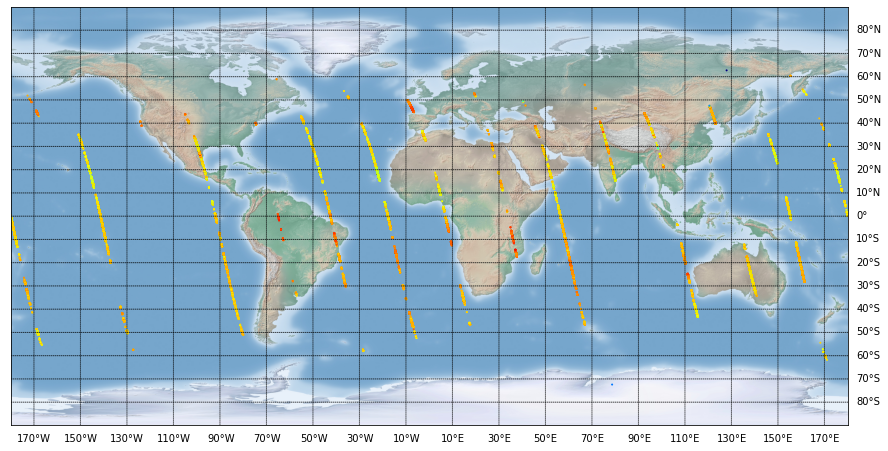

In [0]:
# We consider the October 2016 datset at the right day
data_1610_1017 = data_1610[data_1610['date'] < "2016-10-18"]
data_1610_1017 = data_1610_1017[data_1610_1017['date'] > "2016-10-17"]

draw_map(data_1610_1017)

In [0]:
# We consider the orgit going over East China
data_anshan = data_1610_1017[data_1610_1017['longitude'] > 120]
data_anshan = data_anshan[data_anshan['longitude'] < 130]

# We also spot an unwanted datapoint over Russia (point number 1613182)
data_anshan = data_anshan.drop([1613182])

data_anshan

,sounding_id,latitude,longitude,xco2,xco2_uncert,orbit,windspeed_u,windspeed_v,date
1618475,2016101704551201,39.713848,123.223122,405.396973,0.643978,12202,1.106026,-6.610551,2016-10-17 04:55:12.010
1618476,2016101704551234,39.710373,123.240562,404.653992,0.541921,12202,1.120837,-6.626420,2016-10-17 04:55:12.340
1618477,2016101704551272,39.745937,123.218620,401.544556,0.907313,12202,1.115747,-6.640970,2016-10-17 04:55:12.720
1618478,2016101704551275,39.722454,123.242020,400.760132,0.646142,12202,1.127188,-6.640725,2016-10-17 04:55:12.750
1618479,2016101704551276,39.714558,123.249611,403.785919,0.635035,12202,1.130997,-6.640931,2016-10-17 04:55:12.760
...,...,...,...,...,...,...,...,...,...
1620531,2016101704571778,47.152748,120.692909,400.722778,0.710122,12202,4.842816,-2.710787,2016-10-17 04:57:17.780
1620532,2016101704571806,47.187519,120.666435,400.493011,0.649717,12202,5.069889,-2.819871,2016-10-17 04:57:18.060
1620533,2016101704571902,47.276245,120.604439,395.362579,1.091313,12202,5.636462,-3.072844,2016-10-17 04:57:19.020
1620534,2016101704571935,47.274048,120.626297,401.645233,0.788157,12202,5.613501,-3.085500,2016-10-17 04:57:19.350


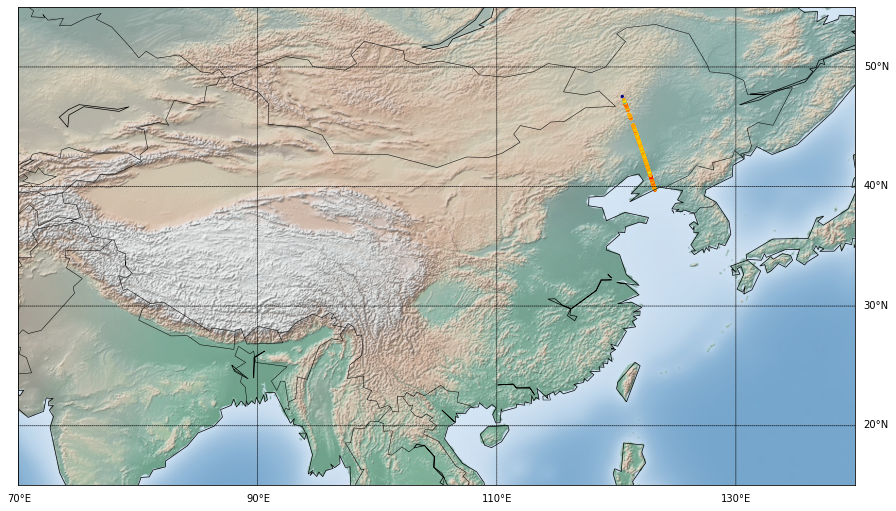

In [0]:
# We retrieve the Figure 2.A
draw_map(data_anshan, lon_min=70, lon_max=140, lat_min=15, lat_max=55, frontier=True, size_point=5)

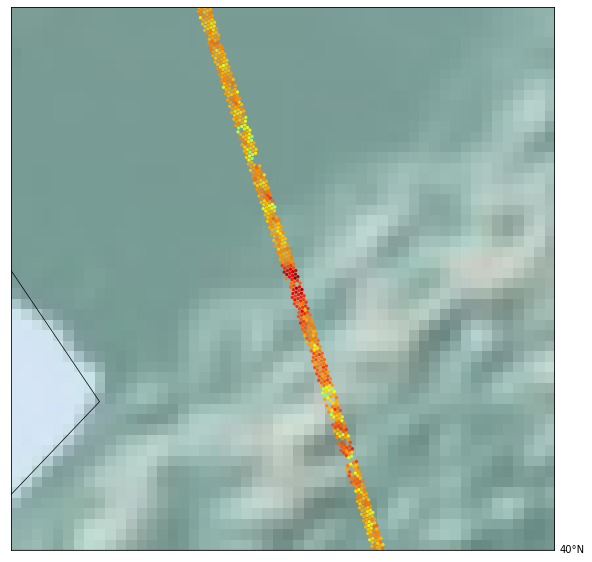

In [0]:
# We represent the observation zoomed on Anshan
draw_map(data_anshan, lon_min=122, lon_max=123.7, lat_min=40, lat_max=41.7, frontier=True, size_point=5)

In [0]:
# We restrict the data to the window studied
data_anshan_restrict = data_anshan.query('longitude>122 and longitude<123.7 and latitude>40 and latitude<41.7')

lon_min = data_anshan_restrict['longitude'].iloc[0]
lat_min = data_anshan_restrict['latitude'].iloc[0]

# We create a 'distance' column considering th distance of the measure to the minimal longitude and latitude
data_anshan_restrict['distance'] = data_anshan_restrict.apply(lambda row: haversine(row, lon_min, lat_min), axis=1)
data_anshan_restrict

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


,sounding_id,latitude,longitude,xco2,xco2_uncert,orbit,windspeed_u,windspeed_v,date,distance
1618557,2016101704551701,40.012833,123.129265,401.519745,0.535533,12202,1.166155,-6.893898,2016-10-17 04:55:17.010,6757.649492
1618558,2016101704551702,40.005138,123.137276,402.293549,0.850998,12202,1.171039,-6.891319,2016-10-17 04:55:17.020,6757.895386
1618562,2016101704551731,40.032860,123.122879,400.636688,0.591878,12202,1.162234,-6.907812,2016-10-17 04:55:17.310,6756.243481
1618563,2016101704551732,40.025169,123.130890,401.229492,0.683111,12202,1.168129,-6.904029,2016-10-17 04:55:17.320,6756.489075
1618564,2016101704551733,40.017395,123.138855,402.170319,0.570602,12202,1.172991,-6.901238,2016-10-17 04:55:17.330,6756.744356
...,...,...,...,...,...,...,...,...,...,...
1619208,2016101704554576,41.687225,122.615387,401.498169,0.484547,12202,0.860433,-5.669064,2016-10-17 04:55:45.760,6639.262992
1619209,2016101704554577,41.679413,122.623375,402.182526,0.454339,12202,0.853610,-5.670618,2016-10-17 04:55:45.770,6639.522890
1619210,2016101704554578,41.671547,122.631264,401.903534,0.522504,12202,0.846649,-5.672243,2016-10-17 04:55:45.780,6639.792535
1619216,2016101704554607,41.699371,122.616951,401.880188,0.504315,12202,0.881808,-5.661693,2016-10-17 04:55:46.070,6638.130129


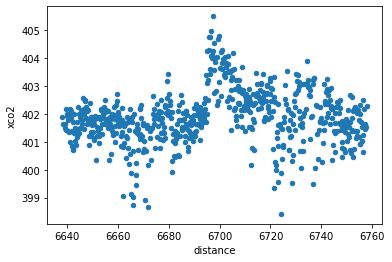

In [0]:
data_anshan_restrict.plot.scatter(x='distance', y='xco2')

---

### Baotou, 17th May 2018

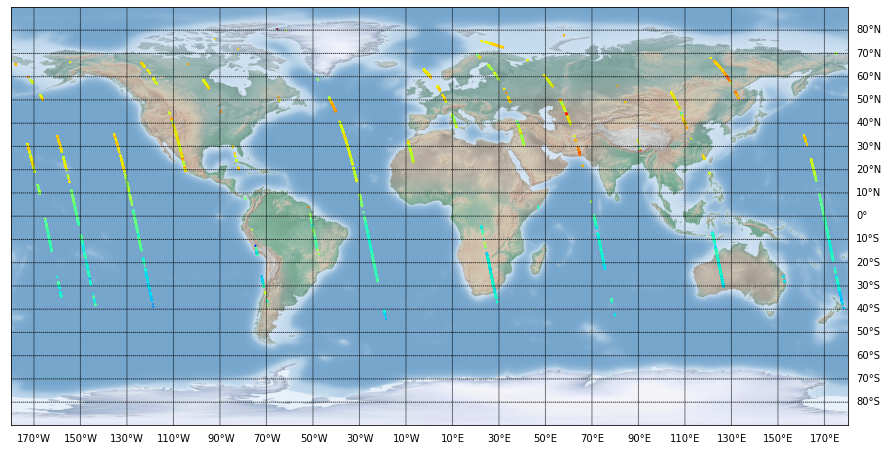

In [0]:
# We consider the May 2018 datset at the right day
data_1805_17 = data_1805[data_1805['date'] < "2018-05-18"]
data_1805_17 = data_1805_17[data_1805_17['date'] > "2018-05-17"]

draw_map(data_1805_17)

In [0]:
# We consider the orgit going over East China (retrieved with the coordinates first, then with the orbit id)
data_baotou = data_1805_17[data_1805_17['orbit'] == 20605]

data_baotou

,sounding_id,latitude,longitude,xco2,xco2_uncert,orbit,windspeed_u,windspeed_v,date
1398272,2018051705191031,-30.556480,126.773727,403.617279,0.448212,20605,-4.640143,2.496437,2018-05-17 05:19:10.310
1398273,2018051705191071,-30.538458,126.769890,402.357697,0.475649,20605,-4.657061,2.510647,2018-05-17 05:19:10.710
1398274,2018051705191401,-30.358664,126.730782,404.189301,0.435722,20605,-4.646074,2.699590,2018-05-17 05:19:14.010
1398275,2018051705191431,-30.340662,126.726868,404.099396,0.439352,20605,-4.640612,2.719563,2018-05-17 05:19:14.310
1398276,2018051705191471,-30.322620,126.722969,402.722961,0.456355,20605,-4.635260,2.739541,2018-05-17 05:19:14.710
...,...,...,...,...,...,...,...,...,...
1408490,2018051705442806,53.289833,104.040840,409.891052,0.765022,20605,0.894804,3.061221,2018-05-17 05:44:28.060
1408491,2018051705442808,53.272186,104.065964,409.573120,0.929197,20605,0.891646,3.007289,2018-05-17 05:44:28.080
1408492,2018051705531733,77.736710,57.864475,410.171082,0.746532,20605,-5.030067,-0.571781,2018-05-17 05:53:17.330
1408493,2018051705531775,77.744179,57.948849,410.165192,0.651399,20605,-5.011450,-0.604521,2018-05-17 05:53:17.750


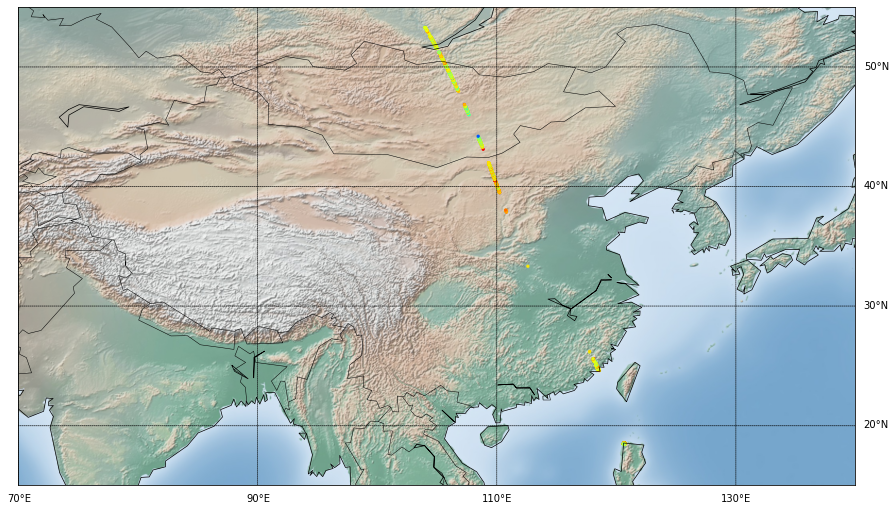

In [0]:
# We retrieve the Figure 2.A
draw_map(data_baotou, lon_min=70, lon_max=140, lat_min=15, lat_max=55, frontier=True, size_point=5)

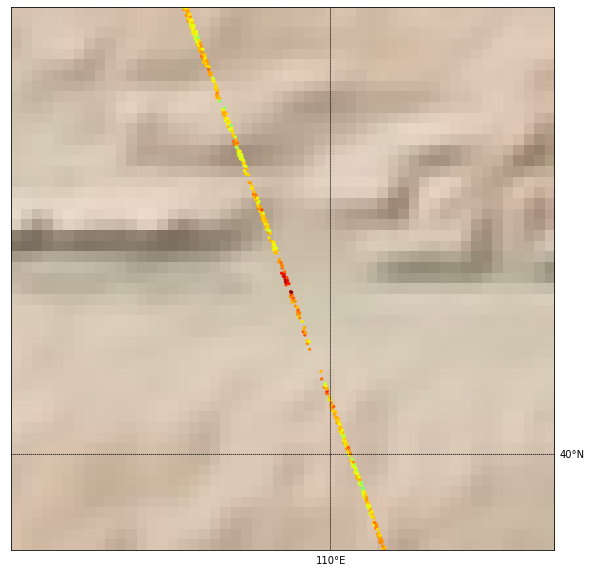

In [0]:
# We represent the observation zoomed on Anshan
draw_map(data_baotou, lon_min=109, lon_max=110.7, lat_min=39.7, lat_max=41.4, frontier=True, size_point=5)

In [0]:
# We restrict the data to the window studied
data_baotou_restrict = data_baotou.query('longitude>109 and longitude<110.7and latitude>39.7 and latitude<41.4')

lon_min = data_anshan_restrict['longitude'].iloc[0]
lat_min = data_anshan_restrict['latitude'].iloc[0]

# We create a 'distance' column considering th distance of the measure to the minimal longitude and latitude
data_baotou_restrict['distance'] = data_baotou_restrict.apply(lambda row: haversine(row, lon_min, lat_min), axis=1)
data_baotou_restrict

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


,sounding_id,latitude,longitude,xco2,xco2_uncert,orbit,windspeed_u,windspeed_v,date,distance
1406381,2018051705401671,39.706150,110.162216,410.447510,0.844058,20605,6.616374,-4.232733,2018-05-17 05:40:16.710,7439.732917
1406386,2018051705401701,39.724422,110.155617,411.826447,0.991852,20605,6.656465,-4.210843,2018-05-17 05:40:17.010,7438.363467
1406391,2018051705401731,39.742889,110.149147,411.029053,0.857783,20605,6.696247,-4.188884,2018-05-17 05:40:17.310,7436.969850
1406392,2018051705401732,39.733047,110.154160,411.387207,0.915564,20605,6.673672,-4.199841,2018-05-17 05:40:17.320,7437.637810
1406393,2018051705401733,39.722965,110.158920,411.238617,0.908178,20605,6.650679,-4.211333,2018-05-17 05:40:17.330,7438.339937
...,...,...,...,...,...,...,...,...,...,...
1406834,2018051705404808,41.358391,109.566971,409.935303,0.776155,20605,7.562441,-5.240523,2018-05-17 05:40:48.080,7315.715712
1406839,2018051705404836,41.396564,109.549515,410.028259,0.768482,20605,7.536522,-5.387716,2018-05-17 05:40:48.360,7313.021110
1406840,2018051705404837,41.386616,109.554855,411.170807,0.747321,20605,7.544033,-5.348670,2018-05-17 05:40:48.370,7313.686335
1406841,2018051705404838,41.376598,109.560081,410.223694,0.742845,20605,7.551347,-5.309278,2018-05-17 05:40:48.380,7314.363209


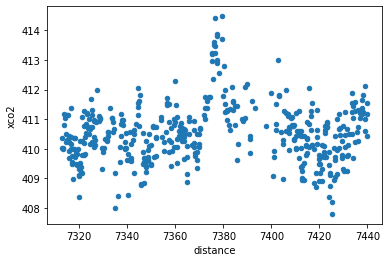

In [0]:
data_baotou_restrict.plot.scatter(x='distance', y='xco2')

---

### Dezhou, 24th September 2018

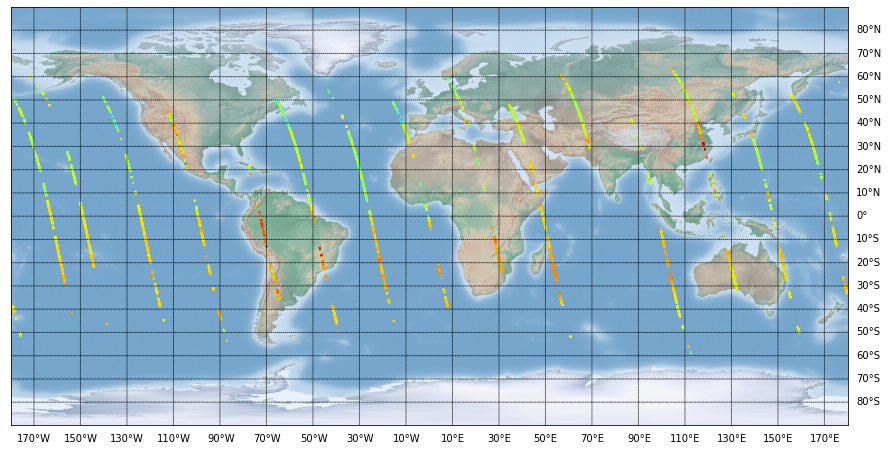

In [0]:
# We consider the September 2018 datset at the right day
data_1809_24 = data_1809[data_1809['date'] < "2018-09-25"]
data_1809_24 = data_1809_24[data_1809_24['date'] > "2018-09-24"]

draw_map(data_1809_24)

In [0]:
# We consider the orgit going over East China
#data_dezhou = data_1809_24[data_1809_24['longitude'] > 115]
#data_dezhou = data_dezhou[data_dezhou['longitude'] < 125]

data_dezhou = data_1809_24[data_1809_24['orbit'] == 22498]

data_dezhou

,sounding_id,latitude,longitude,xco2,xco2_uncert,orbit,windspeed_u,windspeed_v,date
2244321,2018092405065234,-31.974575,132.433289,404.704620,0.367528,22498,-4.025777,1.476680,2018-09-24 05:06:52.340
2244322,2018092405065235,-31.976723,132.420105,404.928131,0.339298,22498,-4.032157,1.452572,2018-09-24 05:06:52.350
2244323,2018092405065237,-31.980803,132.393616,405.949554,0.387624,22498,-4.044868,1.403723,2018-09-24 05:06:52.370
2244324,2018092405065238,-31.982733,132.380356,405.249084,0.468772,22498,-4.051178,1.379073,2018-09-24 05:06:52.380
2244325,2018092405065272,-31.950018,132.454315,407.567993,0.386078,22498,-3.991433,1.458995,2018-09-24 05:06:52.720
...,...,...,...,...,...,...,...,...,...
2255035,2018092405332838,63.666580,103.865494,405.777832,1.116346,22498,1.888981,1.329452,2018-09-24 05:33:28.380
2255036,2018092405332873,63.715221,103.758492,404.681244,1.015830,22498,1.849106,1.326898,2018-09-24 05:33:28.730
2255037,2018092405332876,63.697647,103.813515,405.516846,0.910857,22498,1.863525,1.328544,2018-09-24 05:33:28.760
2255038,2018092405332877,63.691662,103.831566,405.766785,0.946319,22498,1.868399,1.329098,2018-09-24 05:33:28.770


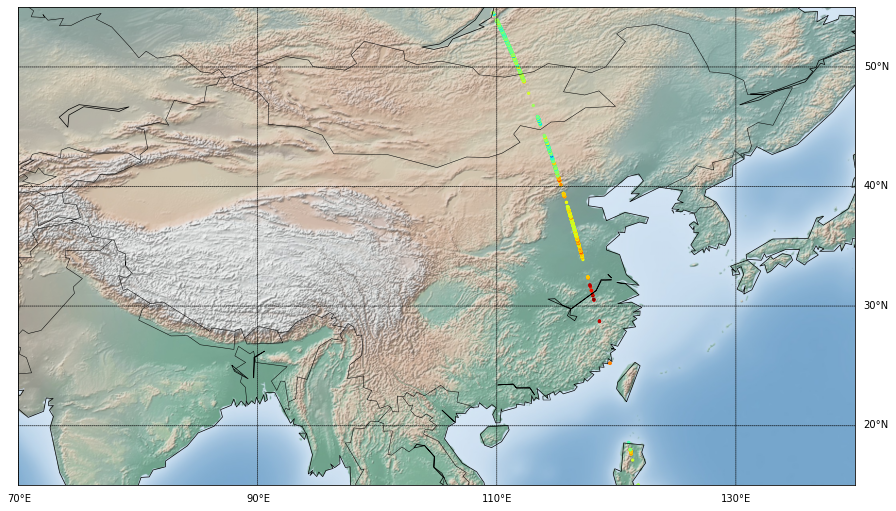

In [0]:
# We retrieve the Figure 2.A
draw_map(data_dezhou, lon_min=70, lon_max=140, lat_min=15, lat_max=55, frontier=True, size_point=5)

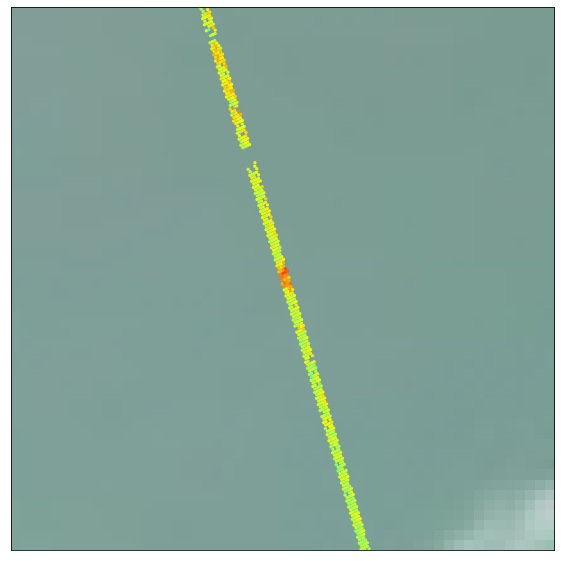

In [0]:
# We represent the observation zoomed on Anshan
draw_map(data_dezhou, lon_min=115.3, lon_max=117.1, lat_min=36.5, lat_max=38.3, frontier=True, size_point=5)

In [0]:
# We restrict the data to the window studied
data_dezhou_restrict = data_dezhou.query('longitude>115.3 and longitude<117.1 and latitude>36.5 and latitude<38.5')

lon_min = data_dezhou_restrict['longitude'].iloc[0]
lat_min = data_dezhou_restrict['latitude'].iloc[0]

# We create a 'distance' column considering th distance of the measure to the minimal longitude and latitude
data_dezhou_restrict['distance'] = data_dezhou_restrict.apply(lambda row: haversine(row, lon_min, lat_min), axis=1)
data_dezhou_restrict

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


,sounding_id,latitude,longitude,xco2,xco2_uncert,orbit,windspeed_u,windspeed_v,date,distance
2251673,2018092405254731,36.503620,116.460190,405.356506,0.653529,22498,-2.676006,-2.669888,2018-09-24 05:25:47.310,6889.582571
2251680,2018092405254771,36.523537,116.454323,405.089783,0.663060,22498,-2.673140,-2.662889,2018-09-24 05:25:47.710,6887.921659
2251681,2018092405254772,36.515282,116.460892,404.981537,0.458675,22498,-2.670804,-2.667496,2018-09-24 05:25:47.720,6888.426263
2251682,2018092405254773,36.506950,116.467392,405.349243,0.627049,22498,-2.668517,-2.672142,2018-09-24 05:25:47.730,6888.941259
2251688,2018092405254801,36.543476,116.448471,405.415070,0.543986,22498,-2.670167,-2.655999,2018-09-24 05:25:48.010,6886.257902
...,...,...,...,...,...,...,...,...,...,...
2252332,2018092405261807,38.290573,115.952286,406.297394,0.670311,22498,-2.157124,-2.219882,2018-09-24 05:26:18.070,6739.917283
2252333,2018092405261808,38.282223,115.958794,406.516113,0.684659,22498,-2.151567,-2.231655,2018-09-24 05:26:18.080,6740.434392
2252334,2018092405261837,38.310497,115.946213,404.022247,0.814230,22498,-2.163852,-2.203840,2018-09-24 05:26:18.370,6738.268611
2252335,2018092405261838,38.302151,115.952721,404.777710,0.800562,22498,-2.158177,-2.215560,2018-09-24 05:26:18.380,6738.785362


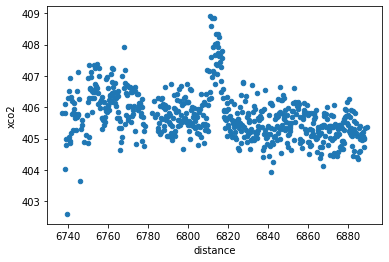

In [0]:
data_dezhou_restrict.plot.scatter(x='distance', y='xco2')

---

### Laiwu, 25th August 2018

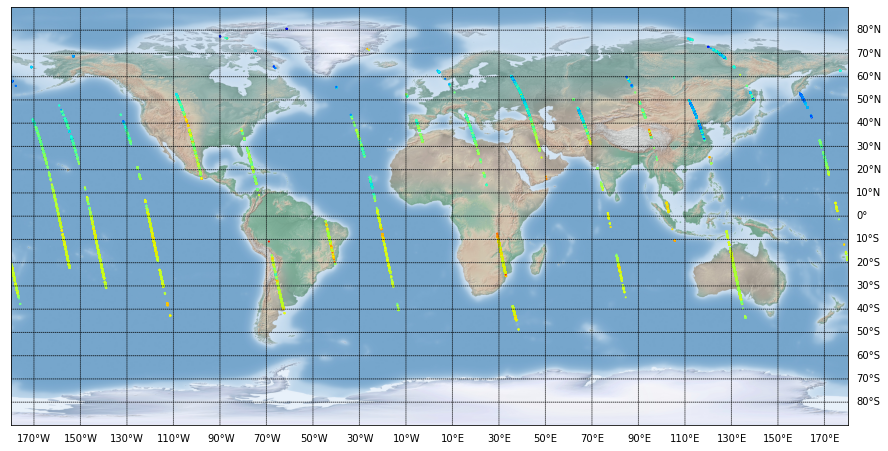

In [0]:
# We consider the August 2018 datset at the right day
data_1808_25 = data_1808[data_1808['date'] < "2018-08-26"]
data_1808_25 = data_1808_25[data_1808_25['date'] > "2018-08-25"]

draw_map(data_1808_25)

In [0]:
# We consider the orgit going over East China
#data_laiwu = data_1808_25[data_1808_25['longitude'] > 110]
#data_laiwu = data_laiwu[data_laiwu['longitude'] < 125]

data_laiwu = data_1808_25[data_1808_25['orbit'] == 22061]

data_laiwu

,sounding_id,latitude,longitude,xco2,xco2_uncert,orbit,windspeed_u,windspeed_v,date
2061319,2018082504501738,-43.749119,135.989822,403.642273,0.572042,22061,11.114212,-4.509858,2018-08-25 04:50:17.380
2061320,2018082504501777,-43.735889,136.010880,404.398529,0.466245,22061,11.103701,-4.486870,2018-08-25 04:50:17.770
2061321,2018082504501778,-43.731358,135.985352,404.115814,0.528921,22061,11.101484,-4.501010,2018-08-25 04:50:17.780
2061322,2018082504501806,-43.722591,136.031830,404.290619,0.449389,22061,11.093133,-4.463718,2018-08-25 04:50:18.060
2061323,2018082504501835,-43.709126,136.052704,403.948914,0.479135,22061,11.082438,-4.440311,2018-08-25 04:50:18.350
...,...,...,...,...,...,...,...,...,...
2073115,2018082505183238,49.763687,111.791290,400.929993,0.781497,22061,0.300315,2.200201,2018-08-25 05:18:32.380
2073116,2018082505214175,59.688877,105.254318,401.177765,1.203000,22061,-0.192591,0.018251,2018-08-25 05:21:41.750
2073117,2018082505214176,59.679939,105.275047,401.176849,1.284261,22061,-0.189052,0.015300,2018-08-25 05:21:41.760
2073118,2018082505214207,59.687191,105.280876,402.654144,1.082323,22061,-0.194836,0.013121,2018-08-25 05:21:42.070


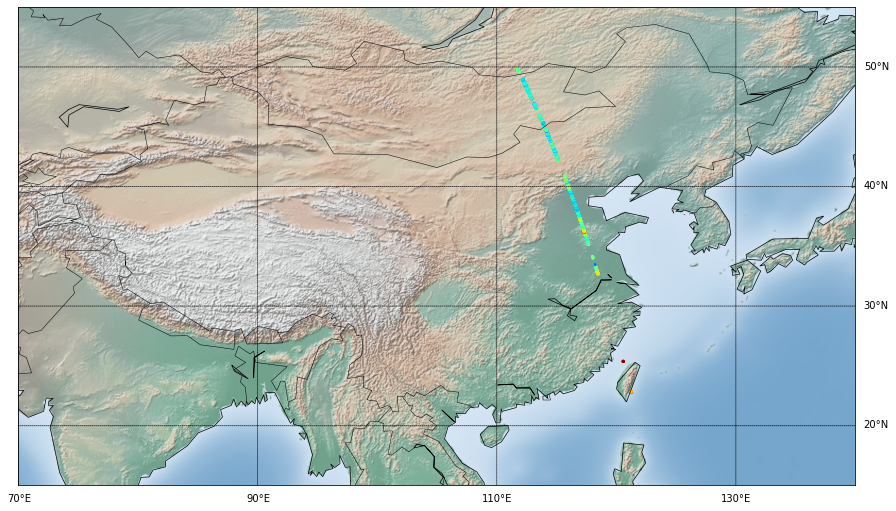

In [0]:
# We retrieve the Figure 2.A
draw_map(data_laiwu, lon_min=70, lon_max=140, lat_min=15, lat_max=55, frontier=True, size_point=5)

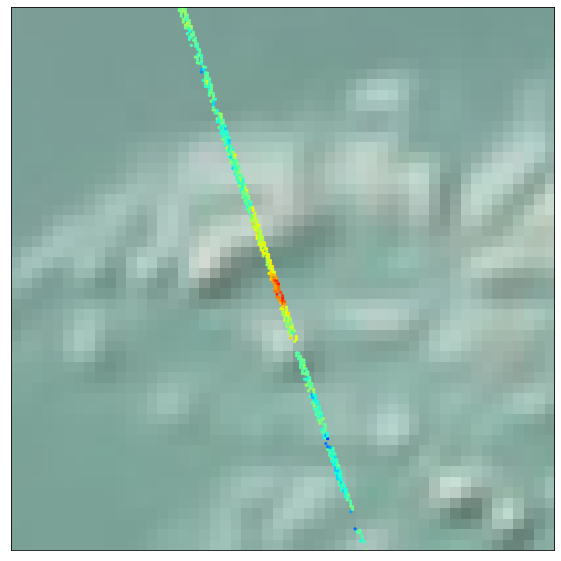

In [0]:
# We represent the observation zoomed on Anshan
draw_map(data_laiwu, lon_min=116.5, lon_max=118.2, lat_min=35.4, lat_max=37.1, frontier=True, size_point=5)

In [0]:
# We restrict the data to the window studied
data_laiwu_restrict = data_laiwu.query('longitude>116.5 and longitude<118.2  and latitude>35.4 and latitude<37.1')

lon_min = data_laiwu_restrict['longitude'].iloc[0]
lat_min = data_laiwu_restrict['latitude'].iloc[0]

# We create a 'distance' column considering th distance of the measure to the minimal longitude and latitude
data_laiwu_restrict['distance'] = data_laiwu_restrict.apply(lambda row: haversine(row, lon_min, lat_min), axis=1)
data_laiwu_restrict

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


,sounding_id,latitude,longitude,xco2,xco2_uncert,orbit,windspeed_u,windspeed_v,date,distance
2069837,2018082505140774,35.429119,117.594986,400.076141,0.716316,22061,-2.914134,-0.235950,2018-08-25 05:14:07.740,6945.696315
2069840,2018082505140802,35.467060,117.577034,398.184967,0.684366,22061,-2.897508,-0.184848,2018-08-25 05:14:08.020,6942.928136
2069841,2018082505140803,35.457211,117.582947,400.502319,0.685602,22061,-2.902577,-0.197750,2018-08-25 05:14:08.030,6943.588047
2069842,2018082505140835,35.455803,117.588387,401.529999,0.628872,22061,-2.905890,-0.198751,2018-08-25 05:14:08.350,6943.466947
2069843,2018082505140837,35.436092,117.599686,400.578766,0.576075,22061,-2.915572,-0.225130,2018-08-25 05:14:08.370,6944.812476
...,...,...,...,...,...,...,...,...,...,...
2070385,2018082505143808,37.056301,117.058731,401.634552,0.652954,22061,-2.511884,1.644871,2018-08-25 05:14:38.080,6816.151165
2070391,2018082505143836,37.094391,117.039970,402.149200,0.752567,22061,-2.441297,1.709189,2018-08-25 05:14:38.360,6813.409651
2070392,2018082505143837,37.084496,117.046188,402.232849,0.695273,22061,-2.459902,1.692454,2018-08-25 05:14:38.370,6814.059565
2070393,2018082505143838,37.074539,117.052299,401.568298,0.741098,22061,-2.478597,1.675727,2018-08-25 05:14:38.380,6814.720206


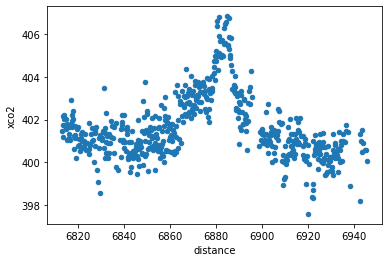

In [0]:
data_laiwu_restrict.plot.scatter(x='distance', y='xco2')

---

### Nanjing, 9th March 2018

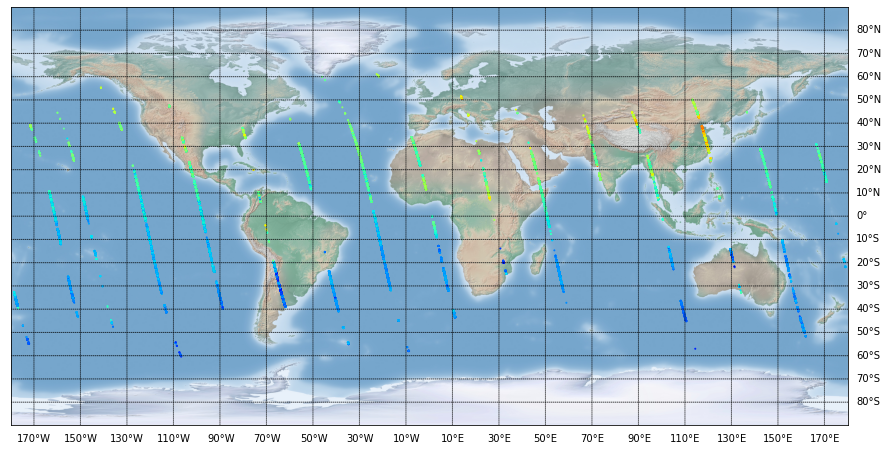

In [0]:
# We consider the March 2018 datset at the right day
data_1803_09 = data_1803[data_1803['date'] < "2018-03-10"]
data_1803_09 = data_1803_09[data_1803_09['date'] > "2018-03-09"]

draw_map(data_1803_09)

In [0]:
# We consider the orgit going over East China
#data_nanjing = data_1803_09[data_1803_09['longitude'] > 115]
#data_nanjing = data_nanjing[data_nanjing['longitude'] < 125]

data_nanjing = data_1803_09[data_1803_09['orbit'] == 19600]

data_nanjing

,sounding_id,latitude,longitude,xco2,xco2_uncert,orbit,windspeed_u,windspeed_v,date
774288,2018030905013078,-32.893936,134.095108,405.924896,0.410294,19600,-2.972941,1.491366,2018-03-09 05:01:30.780
774289,2018030905013101,-32.861305,134.184021,407.432404,0.430512,19600,-3.270708,1.225287,2018-03-09 05:01:31.010
774290,2018030905013102,-32.863373,134.170654,406.648499,0.423339,19600,-3.232368,1.264700,2018-03-09 05:01:31.020
774291,2018030905013103,-32.865364,134.157196,406.607483,0.472549,19600,-3.194245,1.303926,2018-03-09 05:01:31.030
774292,2018030905013104,-32.867268,134.143661,406.519135,0.412724,19600,-3.156398,1.342928,2018-03-09 05:01:31.040
...,...,...,...,...,...,...,...,...,...
777155,2018030905242874,50.047482,113.196968,409.765564,0.565351,19600,1.940813,-3.650892,2018-03-09 05:24:28.740
777156,2018030905242875,50.041122,113.208916,410.043793,0.876736,19600,1.893785,-3.626530,2018-03-09 05:24:28.750
777157,2018030905242876,50.034679,113.220795,408.826447,0.599787,19600,1.847021,-3.602393,2018-03-09 05:24:28.760
777158,2018030905242904,50.067184,113.188614,408.737579,0.777149,19600,1.995163,-3.641963,2018-03-09 05:24:29.040


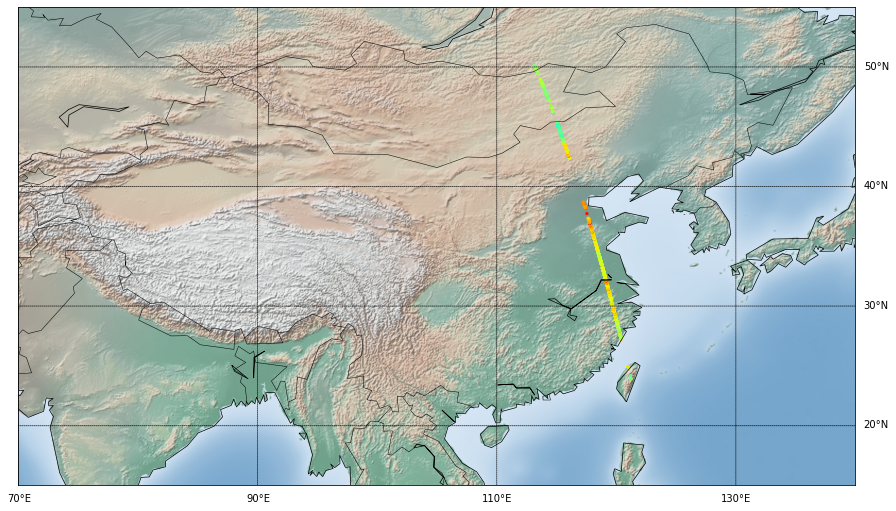

In [0]:
# We retrieve the Figure 2.A
draw_map(data_nanjing, lon_min=70, lon_max=140, lat_min=15, lat_max=55, frontier=True, size_point=5)

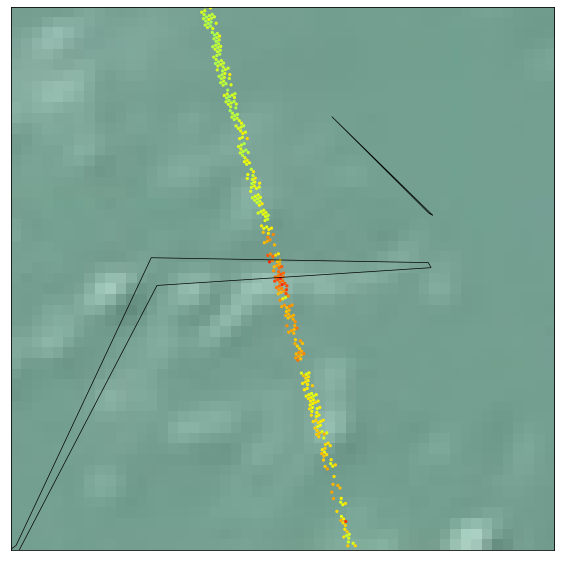

In [0]:
# We represent the observation zoomed on Anshan
draw_map(data_nanjing, lon_min=118.3, lon_max=120, lat_min=31.3, lat_max=33, frontier=True, size_point=5)

In [0]:
# We restrict the data to the window studied
data_nanjing_restrict = data_nanjing.query('longitude>118.3 and longitude<120  and latitude>31.3 and latitude<33')

lon_min = data_nanjing_restrict['longitude'].iloc[0]
lat_min = data_nanjing_restrict['latitude'].iloc[0]

# We create a 'distance' column considering th distance of the measure to the minimal longitude and latitude
data_nanjing_restrict['distance'] = data_nanjing_restrict.apply(lambda row: haversine(row, lon_min, lat_min), axis=1)
data_nanjing_restrict

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


,sounding_id,latitude,longitude,xco2,xco2_uncert,orbit,windspeed_u,windspeed_v,date,distance
775486,2018030905191472,31.313959,119.354256,412.440643,0.941768,19600,1.354087,-1.728690,2018-03-09 05:19:14.720,7114.317244
775490,2018030905191501,31.341694,119.341812,411.871063,0.896037,19600,1.347316,-1.699039,2018-03-09 05:19:15.010,7112.376377
775491,2018030905191503,31.326025,119.355827,410.738647,0.951694,19600,1.355291,-1.723064,2018-03-09 05:19:15.030,7113.111125
775492,2018030905191533,31.346003,119.350426,410.515259,0.956639,19600,1.352511,-1.705437,2018-03-09 05:19:15.330,7111.528725
775493,2018030905191534,31.338078,119.357338,410.892853,1.011362,19600,1.356424,-1.717422,2018-03-09 05:19:15.340,7111.909458
...,...,...,...,...,...,...,...,...,...,...
775815,2018030905194278,32.948311,118.942467,410.990753,0.920671,19600,1.255895,-0.361807,2018-03-09 05:19:42.780,6983.534551
775818,2018030905194304,32.999649,118.908806,410.445251,0.869109,19600,1.229260,-0.317407,2018-03-09 05:19:43.040,6980.498971
775819,2018030905194307,32.976219,118.930099,410.147675,0.974762,19600,1.246704,-0.339534,2018-03-09 05:19:43.070,6981.579663
775820,2018030905194308,32.968296,118.937035,410.604004,0.893977,19600,1.252049,-0.347317,2018-03-09 05:19:43.080,6981.958728


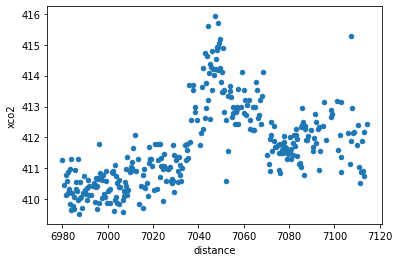

In [0]:
data_nanjing_restrict.plot.scatter(x='distance', y='xco2')

---

### Tangshan, 18th March 2017

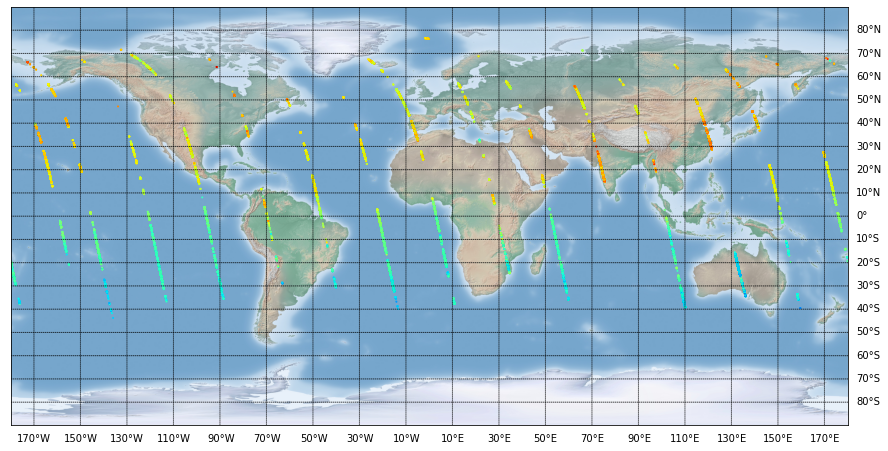

In [0]:
# We consider the August 2018 datset at the right day
data_1705_18 = data_1705[data_1705['date'] < "2017-05-19"]
data_1705_18 = data_1705_18[data_1705_18['date'] > "2017-05-18"]

draw_map(data_1705_18)

In [0]:
# We consider the orgit going over East China
#data_tangshan = data_1705_18[data_1705_18['longitude'] > 110]
#data_tangshan = data_tangshan[data_tangshan['longitude'] < 125]

data_tangshan = data_1705_18[data_1705_18['orbit'] == 15304]

data_tangshan

,sounding_id,latitude,longitude,xco2,xco2_uncert,orbit,windspeed_u,windspeed_v,date
1435063,2017051804535708,-34.499416,136.092346,402.725983,0.441209,15304,-3.124291,0.773405,2017-05-18 04:53:57.080
1435064,2017051804535737,-34.480766,136.101074,401.561615,0.435428,15304,-3.095217,0.765590,2017-05-18 04:53:57.370
1435065,2017051804535738,-34.479500,136.086716,402.021851,0.429804,15304,-3.096632,0.767331,2017-05-18 04:53:57.380
1435066,2017051804535777,-34.460827,136.095459,401.459717,0.451545,15304,-3.067521,0.759512,2017-05-18 04:53:57.770
1435067,2017051804535778,-34.459560,136.081116,400.935150,0.475128,15304,-3.068939,0.761223,2017-05-18 04:53:57.780
...,...,...,...,...,...,...,...,...,...
1442739,2017051805213831,65.030724,105.592751,405.706451,0.921386,15304,0.966269,-1.750624,2017-05-18 05:21:38.310
1442740,2017051805213901,65.068771,105.557571,407.058624,0.874896,15304,0.945448,-1.749902,2017-05-18 05:21:39.010
1442741,2017051805213932,65.082306,105.559853,402.380981,0.642988,15304,0.941750,-1.752096,2017-05-18 05:21:39.320
1442742,2017051805214005,65.103180,105.583496,406.184021,0.512709,15304,0.941109,-1.758598,2017-05-18 05:21:40.050


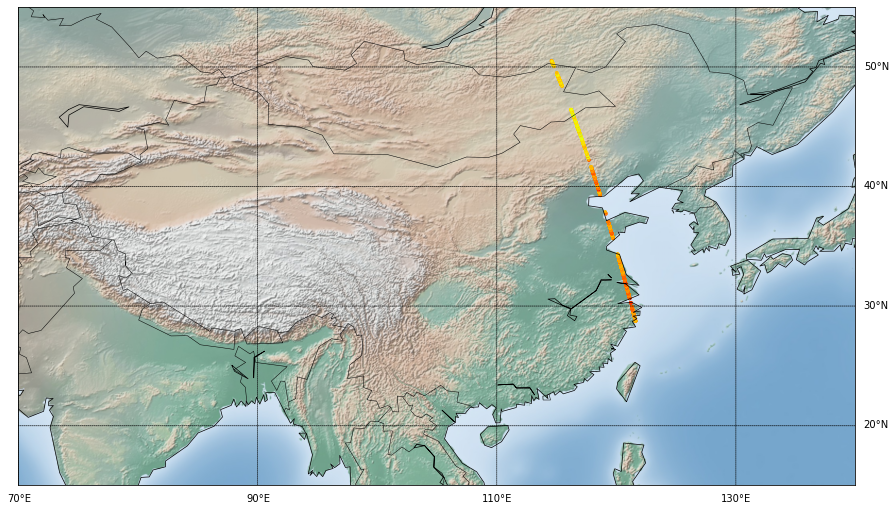

In [0]:
# We retrieve the Figure 2.A
draw_map(data_tangshan, lon_min=70, lon_max=140, lat_min=15, lat_max=55, frontier=True, size_point=5)

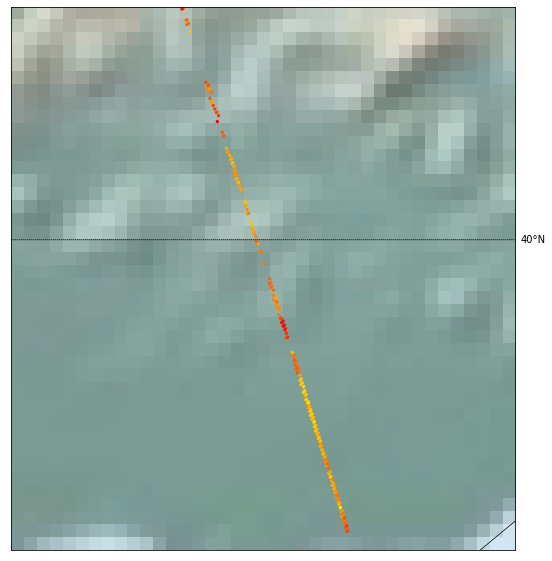

In [0]:
# We represent the observation zoomed on Anshan
draw_map(data_tangshan, lon_min=117.8, lon_max=119.1, lat_min=39.2, lat_max=40.6, frontier=True, size_point=5)

In [0]:
# We restrict the data to the window studied
data_tangshan_restrict = data_tangshan.query('longitude>117.8 and longitude<119.1  and latitude>39.2 and latitude<40.6')

lon_min = data_tangshan_restrict['longitude'].iloc[0]
lat_min = data_tangshan_restrict['latitude'].iloc[0]

# We create a 'distance' column considering th distance of the measure to the minimal longitude and latitude
data_tangshan_restrict['distance'] = data_tangshan_restrict.apply(lambda row: haversine(row, lon_min, lat_min), axis=1)
data_tangshan_restrict

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


,sounding_id,latitude,longitude,xco2,xco2_uncert,orbit,windspeed_u,windspeed_v,date,distance
1441293,2017051805142031,39.268059,118.659294,409.865662,0.792093,15304,1.955974,4.938334,2017-05-18 05:14:20.310,6766.578503
1441294,2017051805142032,39.258781,118.663086,410.766327,0.496066,15304,1.902134,4.912851,2017-05-18 05:14:20.320,6767.270741
1441295,2017051805142033,39.249439,118.666801,411.688782,0.534073,15304,1.847724,4.887047,2017-05-18 05:14:20.330,6767.972598
1441296,2017051805142071,39.287979,118.653069,408.824860,0.832045,15304,2.072734,4.994613,2017-05-18 05:14:20.710,6765.003114
1441297,2017051805142072,39.278709,118.656891,410.028320,0.666536,15304,2.019178,4.969284,2017-05-18 05:14:20.720,6765.693207
...,...,...,...,...,...,...,...,...,...,...
1441554,2017051805144234,40.555550,118.256111,409.701538,0.433667,15304,4.114278,4.674913,2017-05-18 05:14:42.340,6664.883418
1441555,2017051805144272,40.593811,118.241089,412.106232,0.554296,15304,4.037082,4.533223,2017-05-18 05:14:42.720,6662.003725
1441556,2017051805144275,40.566322,118.253983,410.119080,0.386038,15304,4.092721,4.634257,2017-05-18 05:14:42.750,6663.976080
1441557,2017051805144276,40.557110,118.258072,410.099548,0.440312,15304,4.110785,4.668066,2017-05-18 05:14:42.760,6664.647737


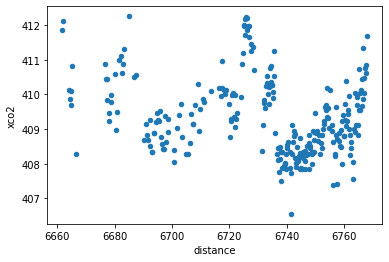

In [0]:
data_tangshan_restrict.plot.scatter(x='distance', y='xco2')